In [54]:
# Importar las bibliotecas necesarias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [51]:
# Cargar el dataset desde el archivo CSV
url = ("https://raw.githubusercontent.com/ppGodel/"
        "data_mining/main/csv/typed_uanl.csv")
df = pd.read_csv(url)
df['Fecha'] = pd.to_datetime(df['Fecha'])
df.head()

,Nombre,Sueldo Neto,dependencia,Fecha,Tipo
0,BRENDA AZENETH PICAZO GARCIA,8620.34,JUNTA DE GOBIERNO,2019-12-01,ADMIN
1,MARIA BEATRIZ VILLAGOMEZ GONZALEZ,7401.35,JUNTA DE GOBIERNO,2019-12-01,ADMIN
2,MARTHA ALICIA SILVA HERNANDEZ,5326.98,JUNTA DE GOBIERNO,2019-12-01,ADMIN
3,ALBERTINA DAVILA PUENTE,9483.10,RECTORIA,2019-12-01,ADMIN
4,AMELIA GRACIELA MARTINEZ DE LA PENA,9278.10,RECTORIA,2019-12-01,ADMIN


In [52]:
# Descripción general del dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 636201 entries, 0 to 636200
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Nombre       636201 non-null  object        
 1   Sueldo Neto  636201 non-null  float64       
 2   dependencia  636201 non-null  object        
 3   Fecha        636201 non-null  datetime64[ns]
 4   Tipo         636201 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 24.3+ MB


In [5]:
# Estadísticas descriptivas
df.describe()

,Sueldo Neto
count,636201.000000
mean,14241.682401
std,9578.442311
min,175.410000
25%,8007.660000
50%,11426.500000
75%,17654.630000
max,147051.590000


In [6]:
# Verificar la presencia de valores nulos
df.isnull().sum()

Nombre         0
Sueldo Neto    0
dependencia    0
Fecha          0
Tipo           0
dtype: int64

Entidades: Empleados, Dependencias, Tipos de Empleados

In [7]:
# 1. Estadísticas descriptivas para Empleados
df['Sueldo Neto'].describe()

count    636201.000000
mean      14241.682401
std        9578.442311
min         175.410000
25%        8007.660000
50%       11426.500000
75%       17654.630000
max      147051.590000
Name: Sueldo Neto, dtype: float64

In [8]:
# 2. Estadísticas descriptivas por Dependencias
df.groupby('dependencia')['Sueldo Neto'].describe().head()

,count,mean,std,min,25%,50%,75%,max
dependencia,,,,,,,,
AUDITORIA INTERNA DE LA U.A.N.L.,2708.0,12993.491939,6173.853285,2694.80,9408.9500,11661.40,14398.2700,68323.61
C. INNOVACION; INVEST. Y DESLLO. DE INGENIERIA Y TECNOLOGIA,360.0,12454.441083,5296.206710,5045.30,9000.7325,11515.42,14706.0475,35590.67
C.DE ESTUDIOS HUMANISTICOS,244.0,15591.806762,5655.643685,2895.11,11826.1600,14995.69,16686.2700,43505.89
C.DE INV.Y DES.DE ED.BILINGUE,2479.0,14503.070670,8174.759578,2903.41,9279.9700,13294.46,17465.2550,77130.15
CAPILLA ALFONSINA BIBLIOTECA UNIVERSITARIA,1928.0,11789.009435,6349.997558,1535.48,8349.5600,10856.49,13747.8775,78959.29


In [9]:
# 3. Estadísticas descriptivas por Fecha
df.groupby('Fecha')['Sueldo Neto'].describe().head()

,count,mean,std,min,25%,50%,75%,max
Fecha,,,,,,,,
2019-12-01,14410.0,10640.372254,7764.839265,294.44,5355.4275,8182.245,13347.0500,86245.29
2020-01-01,12701.0,11344.205985,8844.232417,175.41,5363.1400,8339.720,14186.4600,97698.38
2020-02-01,13865.0,11231.748742,8631.169699,350.98,5422.5200,8448.720,14185.3400,97274.55
2020-03-01,14210.0,11289.436923,8149.261638,177.20,5715.9300,8799.530,14061.7325,89433.90
2020-04-01,14309.0,11735.022899,8773.715312,291.75,5740.7200,9082.700,14635.8600,98881.96


In [10]:
# 4. Estadísticas descriptivas por tipo de empleado
df.groupby('Tipo')['Sueldo Neto'].describe()

,count,mean,std,min,25%,50%,75%,max
Tipo,,,,,,,,
ADMIN,76994.0,13304.198963,9923.529504,177.20,8292.6850,10957.330,14529.4075,147051.59
CENTRO,25117.0,12785.914565,8274.192377,245.38,8234.1000,11041.570,14686.5700,120970.94
FACULTAD,274527.0,16515.567721,11037.232652,177.20,8255.9650,13543.890,22498.0300,144501.40
HOSPITAL,105549.0,9631.383249,4168.207964,175.41,6946.2000,8629.980,11622.8300,85007.77
OTRO,12190.0,11413.737791,5779.618889,285.73,8113.6900,10544.350,13261.7950,78959.29
PREPARATORIA,141824.0,14281.078522,8185.434724,187.54,8370.3625,12471.435,18114.4575,115258.74


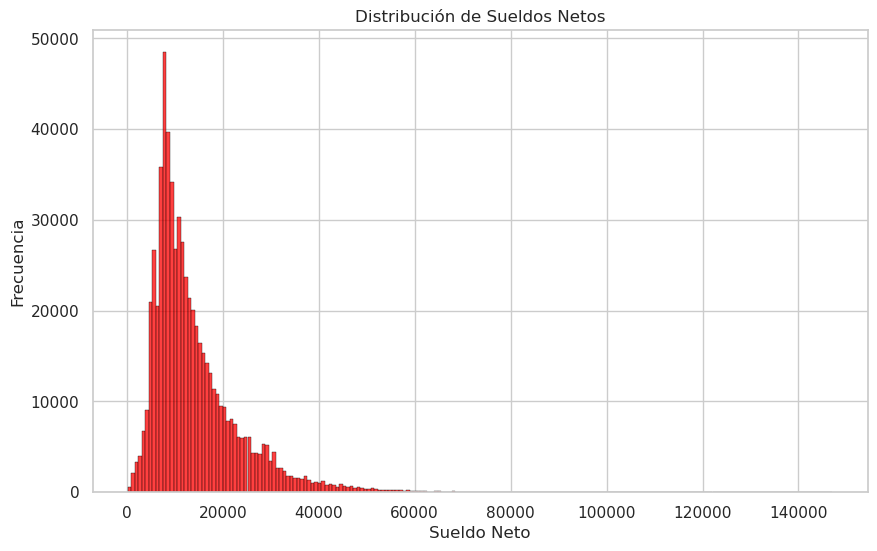

In [11]:
# Distribución de Sueldos Netos
os.makedirs('img', exist_ok=True)
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.histplot(df['Sueldo Neto'], bins=200, color='red', edgecolor='black')
plt.title('Distribución de Sueldos Netos')
plt.xlabel('Sueldo Neto')
plt.ylabel('Frecuencia')

plt.savefig('img/histograma_sueldos.png')
plt.show()

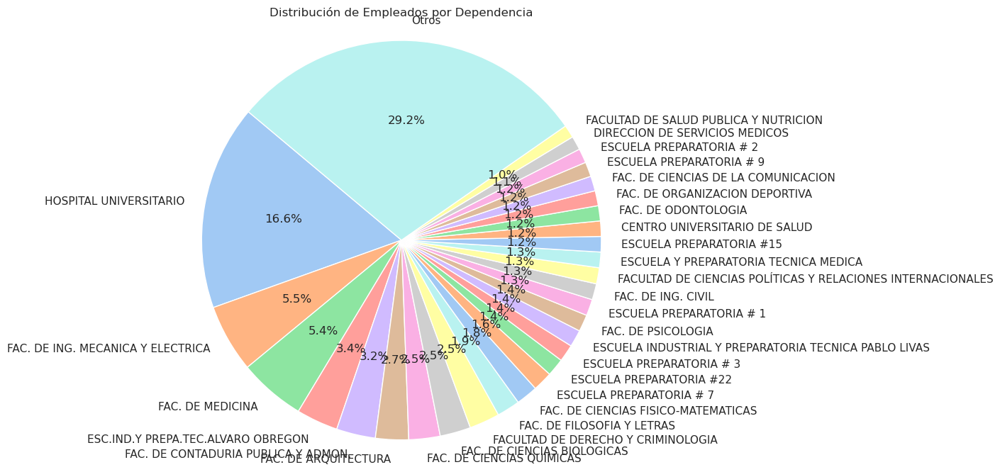

In [26]:
# Gráfico de pastel de dependencias
sns.set(style="whitegrid")

conteo_dependencias = df['dependencia'].value_counts()

umbral = 6000

otros_conteo = conteo_dependencias[conteo_dependencias < umbral].sum()
conteo_dependencias_filtrado = conteo_dependencias[conteo_dependencias >= umbral]
conteo_dependencias_filtrado['Otros'] = otros_conteo

plt.figure(figsize=(8, 8))
plt.title('Distribución de Empleados por Dependencia')
plt.pie(conteo_dependencias_filtrado, labels=conteo_dependencias_filtrado.index,
        autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.axis('equal')

plt.savefig('img/grafico_pastel_dependencias.png')
plt.show()

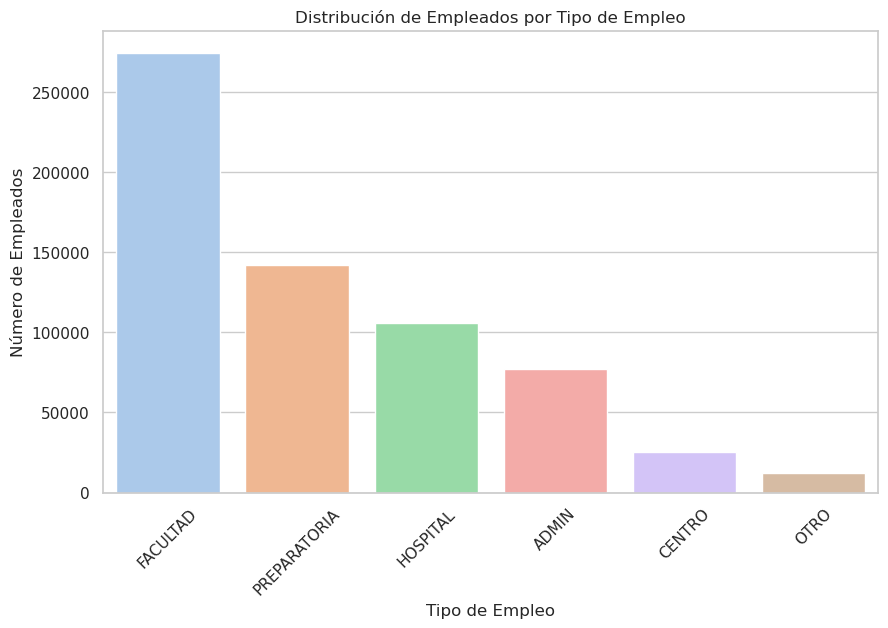

In [15]:
conteo_tipos = df['Tipo'].value_counts()
conteo_tipos_df = pd.DataFrame({
    'Tipo': conteo_tipos.index,
    'Conteo': conteo_tipos.values
})

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.barplot(x='Tipo', y='Conteo', data=conteo_tipos_df, palette='pastel',
            hue='Tipo', dodge=False, legend=False)
plt.title('Distribución de Empleados por Tipo de Empleo')
plt.xlabel('Tipo de Empleo')
plt.ylabel('Número de Empleados')

plt.xticks(rotation=45)

plt.savefig('img/grafico_barras_tipos_empleo.png')
plt.show()

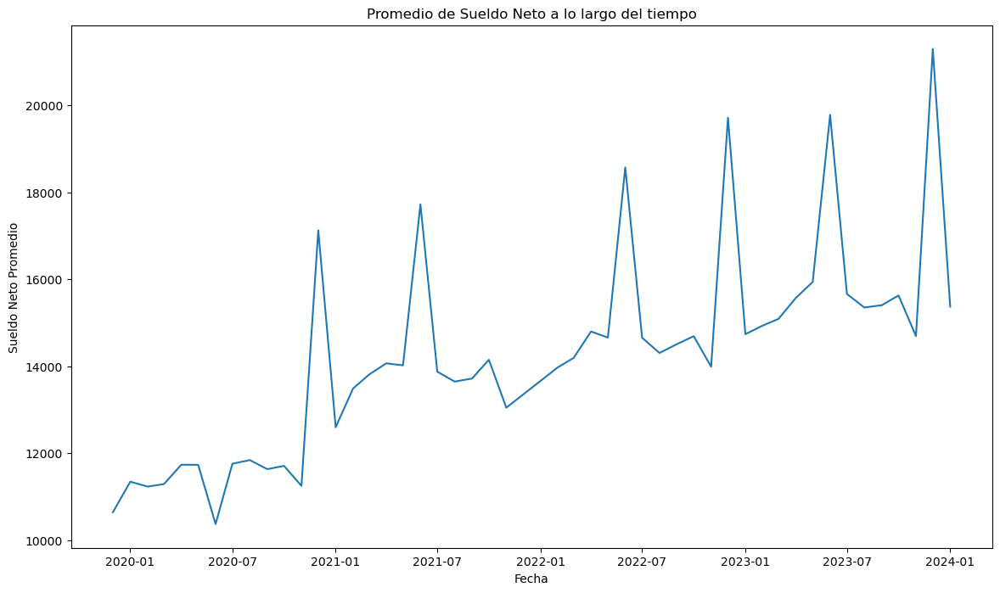

In [67]:
# Análisis temporal de los sueldos
sueldo_fecha = df.groupby('Fecha')['Sueldo Neto'].mean()
plt.figure(figsize=(14, 8))
plt.plot(sueldo_fecha.index, sueldo_fecha.values)
plt.title('Promedio de Sueldo Neto a lo largo del tiempo')
plt.xlabel('Fecha')
plt.ylabel('Sueldo Neto Promedio')
plt.show()

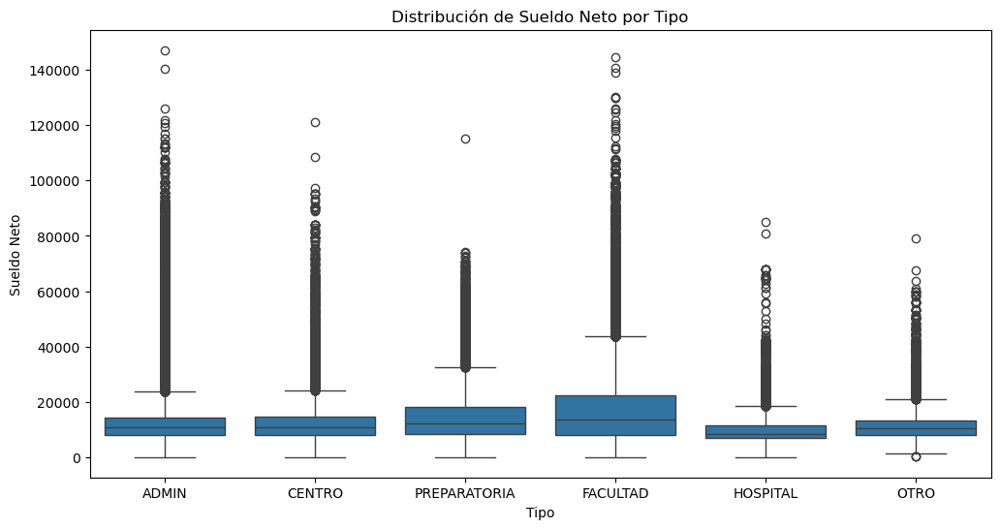

In [64]:
# Boxplot de Sueldo Neto por Tipo
plt.figure(figsize=(12, 6))
sns.boxplot(x='Tipo', y='Sueldo Neto', data=df)
plt.title('Distribución de Sueldo Neto por Tipo')
plt.xlabel('Tipo')
plt.ylabel('Sueldo Neto')
plt.show()

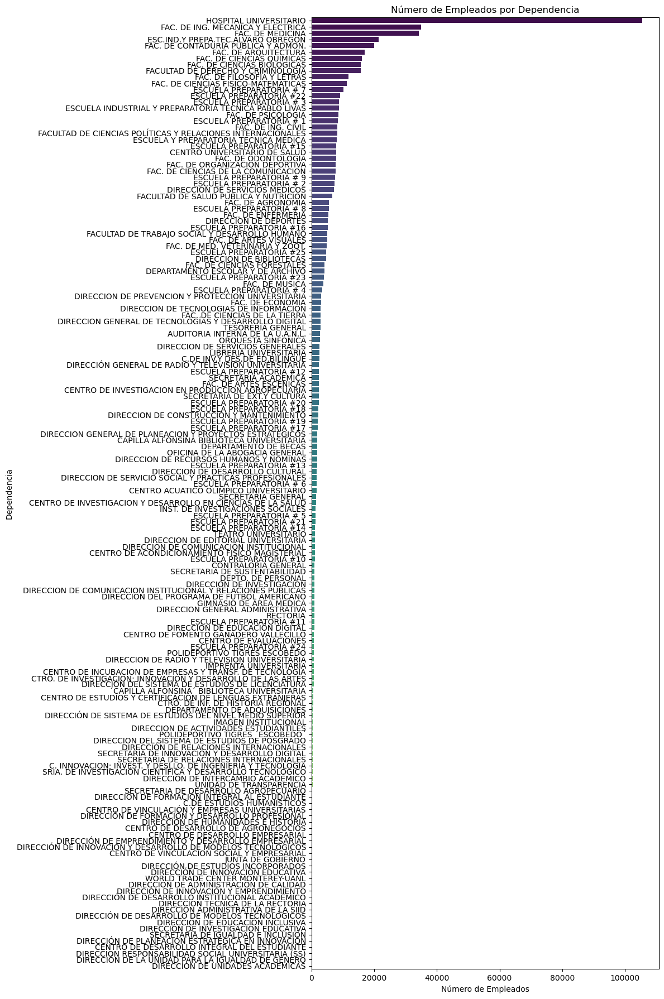

In [65]:
# Conteo de empleados por dependencia
dependencia_counts = df['dependencia'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(12, 18))
plot = sns.barplot(x=dependencia_counts.values, y=dependencia_counts.index,
                    hue=dependencia_counts.index, palette="viridis",
                    dodge=False)

plt.title('Número de Empleados por Dependencia')
plt.xlabel('Número de Empleados')
plt.ylabel('Dependencia')

plt.tight_layout()
plt.show()

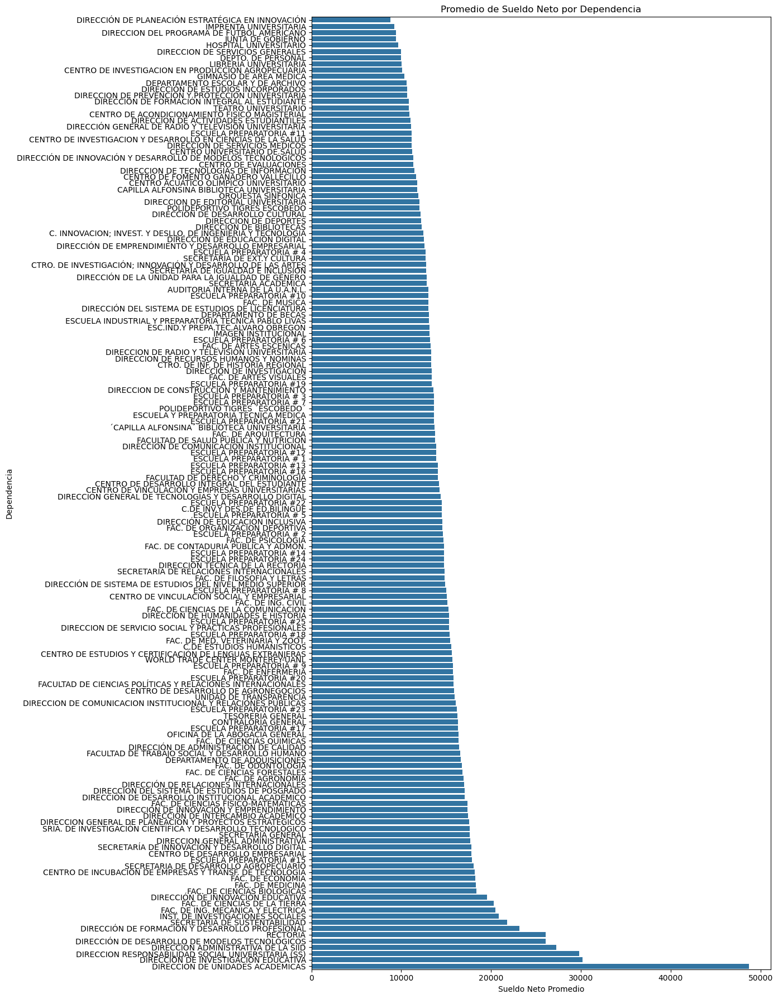

In [66]:
# Análisis de correlación entre SUeldo Neto y Dependencia
avg_sueldo_dependencia = df.groupby('dependencia')['Sueldo Neto'].mean().sort_values()

plt.figure(figsize=(14, 18))
sns.barplot(x=avg_sueldo_dependencia.values, y=avg_sueldo_dependencia.index)

plt.title('Promedio de Sueldo Neto por Dependencia')
plt.xlabel('Sueldo Neto Promedio')
plt.ylabel('Dependencia')

plt.tight_layout()
plt.show()

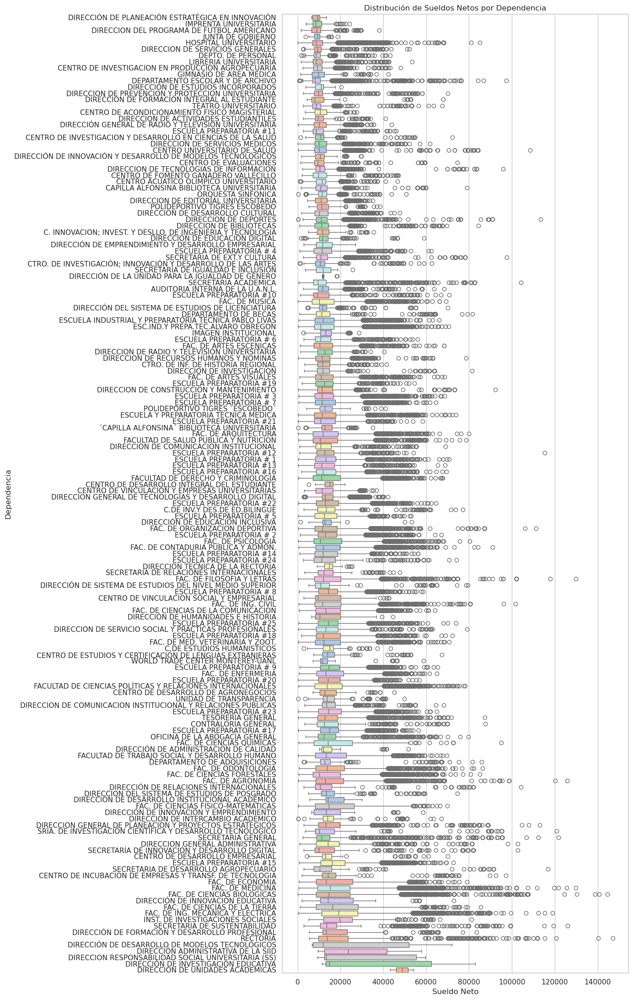

In [33]:
sns.set(style="whitegrid")

orden_dependencias = df.groupby('dependencia')['Sueldo Neto'].mean().sort_values().index

plt.figure(figsize=(14, 22))
sns.boxplot(data=df, x='Sueldo Neto', y='dependencia', palette='pastel',
            order=orden_dependencias, hue='dependencia', dodge=False,
            legend=False)
plt.title('Distribución de Sueldos Netos por Dependencia')
plt.xlabel('Sueldo Neto')
plt.ylabel('Dependencia')

plt.tight_layout()
plt.show()

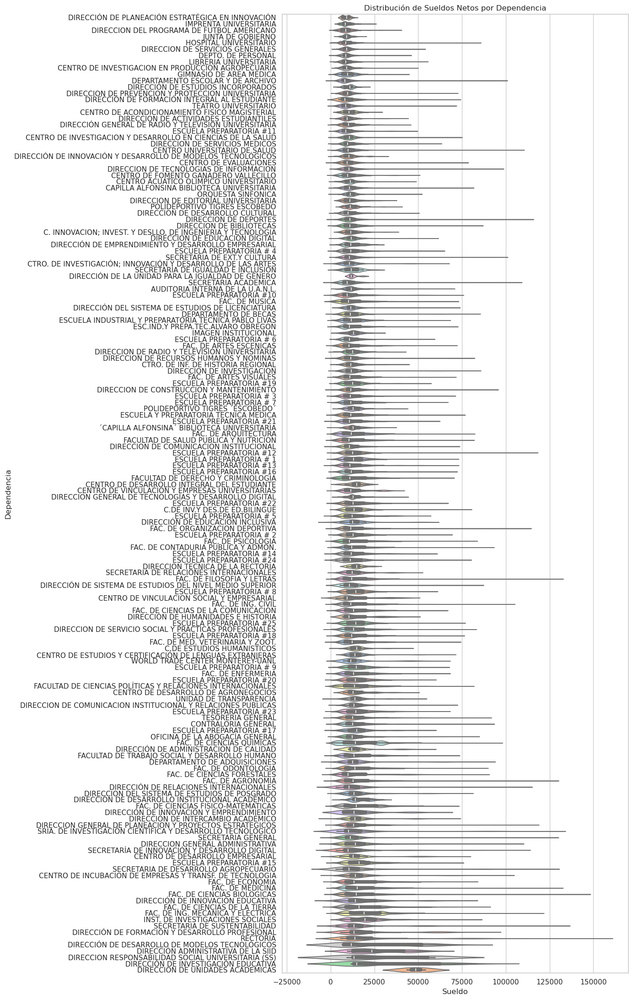

In [35]:
sns.set(style="whitegrid")

plt.figure(figsize=(14, 22))
sns.violinplot(data=df, x='Sueldo Neto', y='dependencia', palette='pastel',
                density_norm='width', order=orden_dependencias,
                hue='dependencia', dodge=False, legend=False)
plt.title('Distribución de Sueldos Netos por Dependencia')
plt.xlabel('Sueldo')
plt.ylabel('Dependencia')

plt.tight_layout()
plt.show()

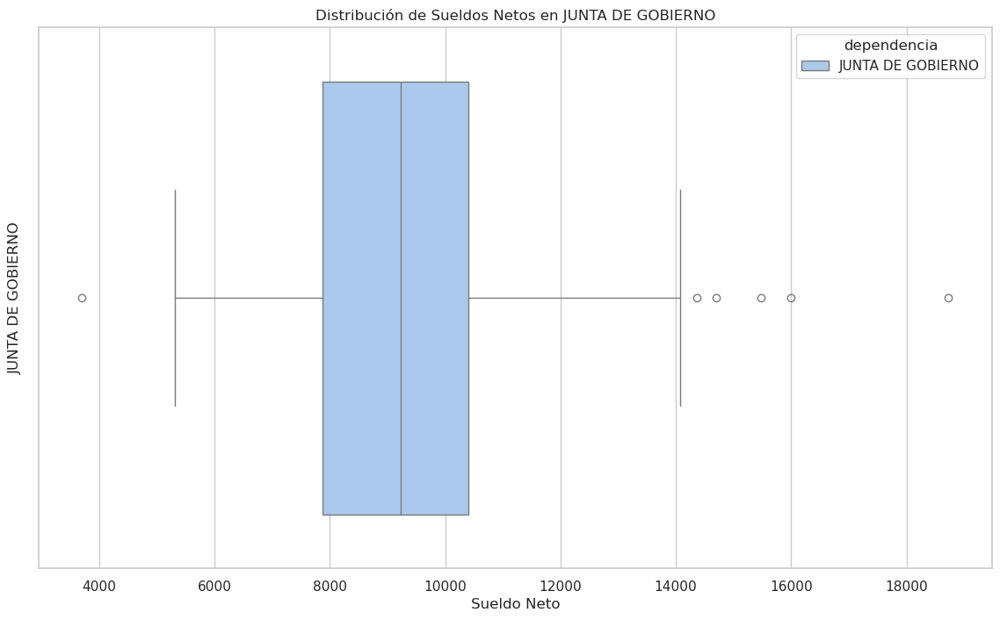

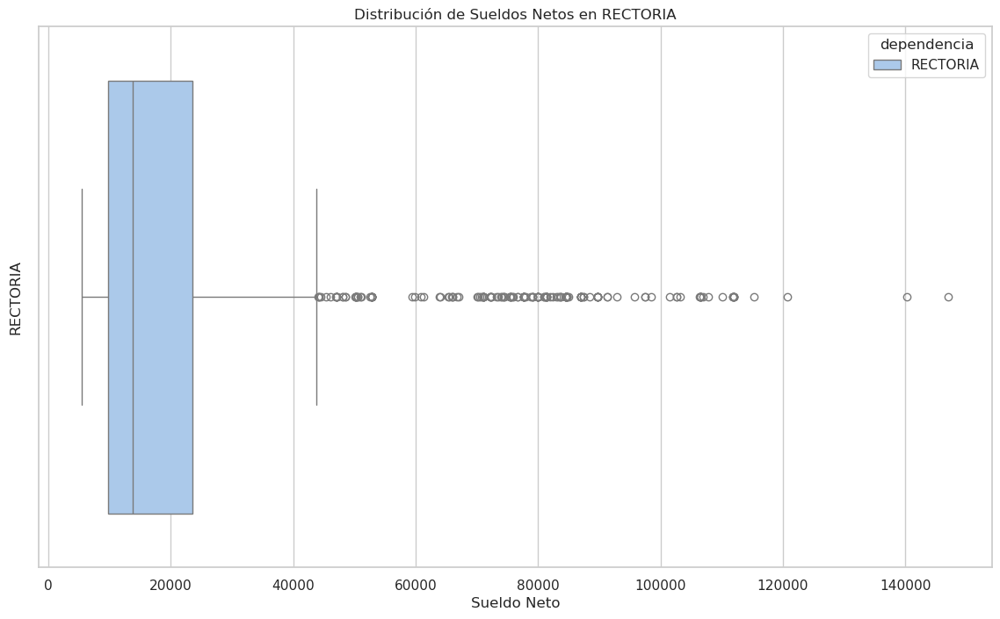

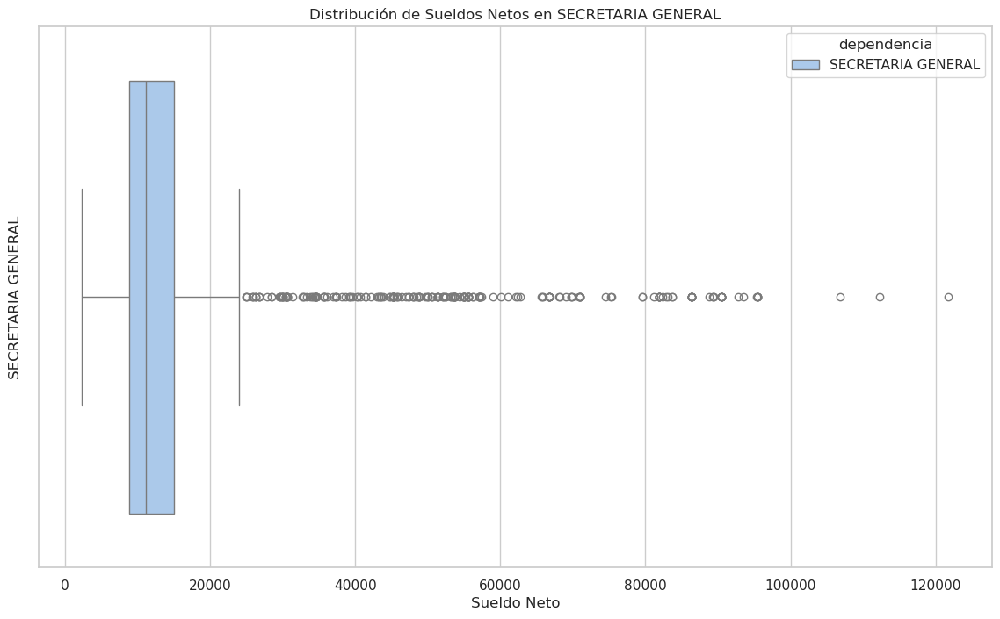

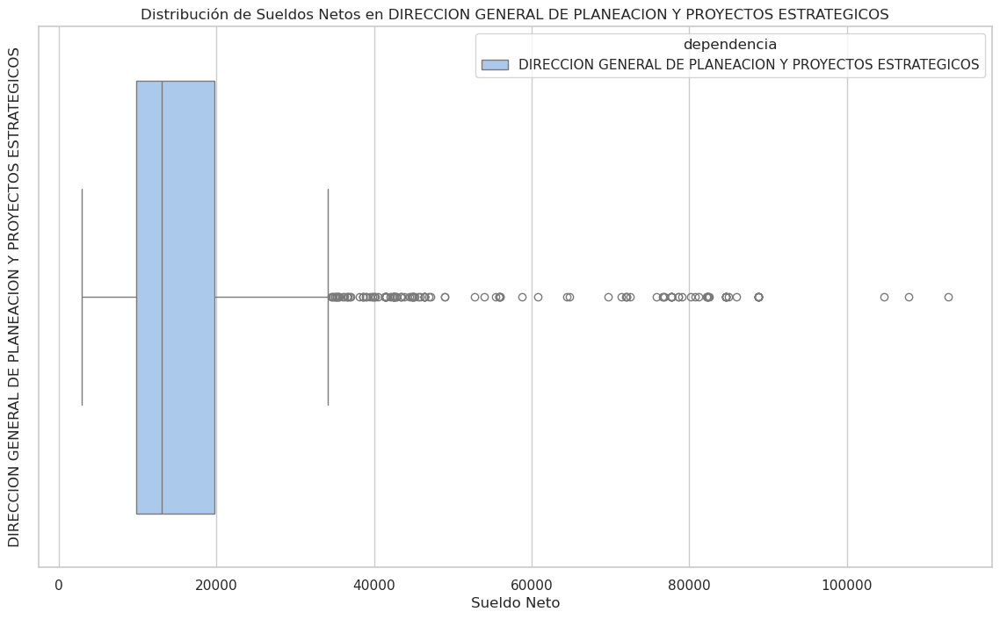

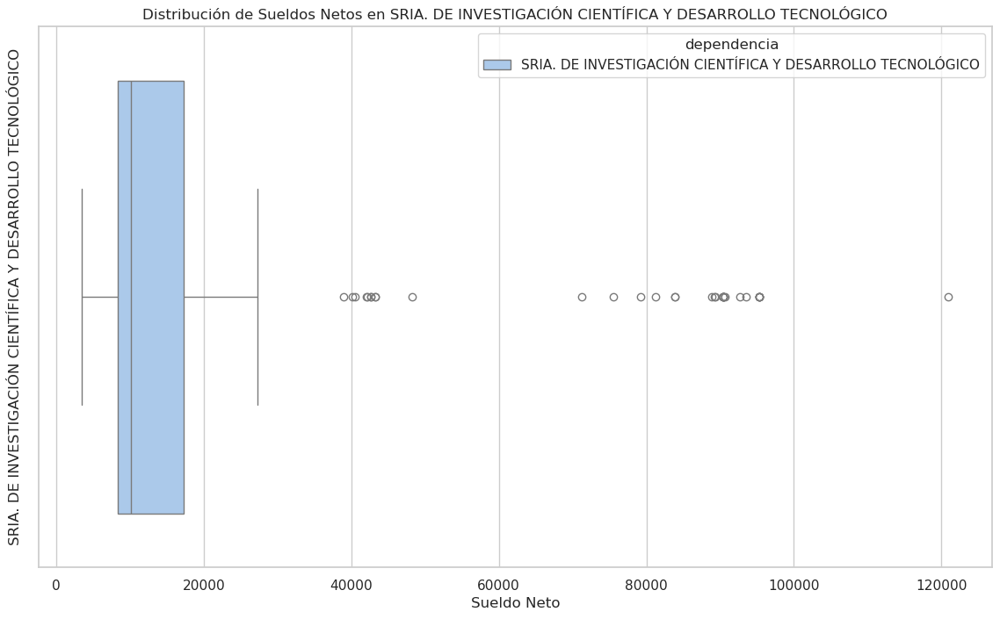

...

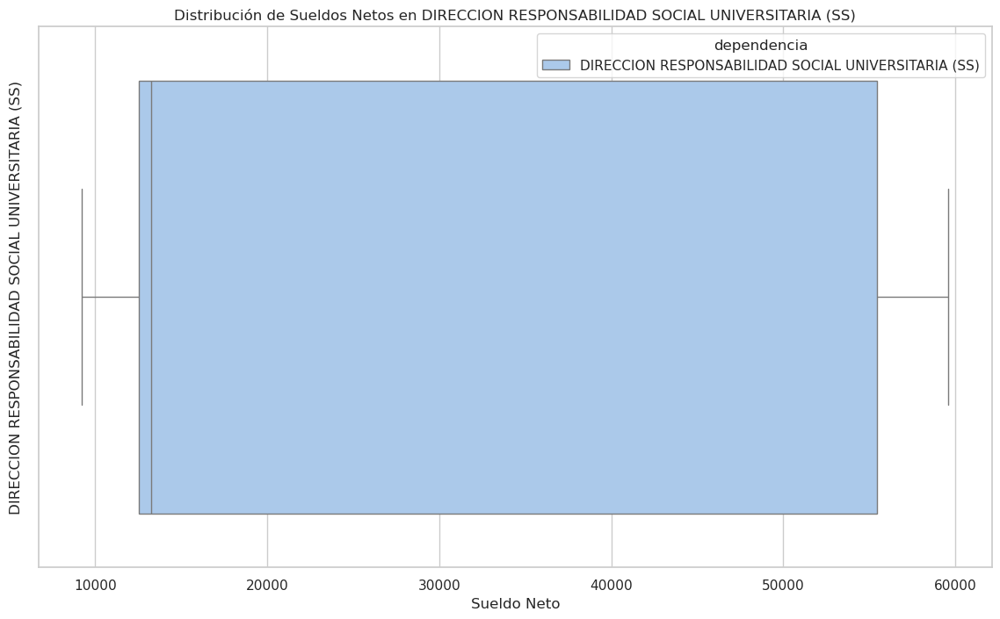

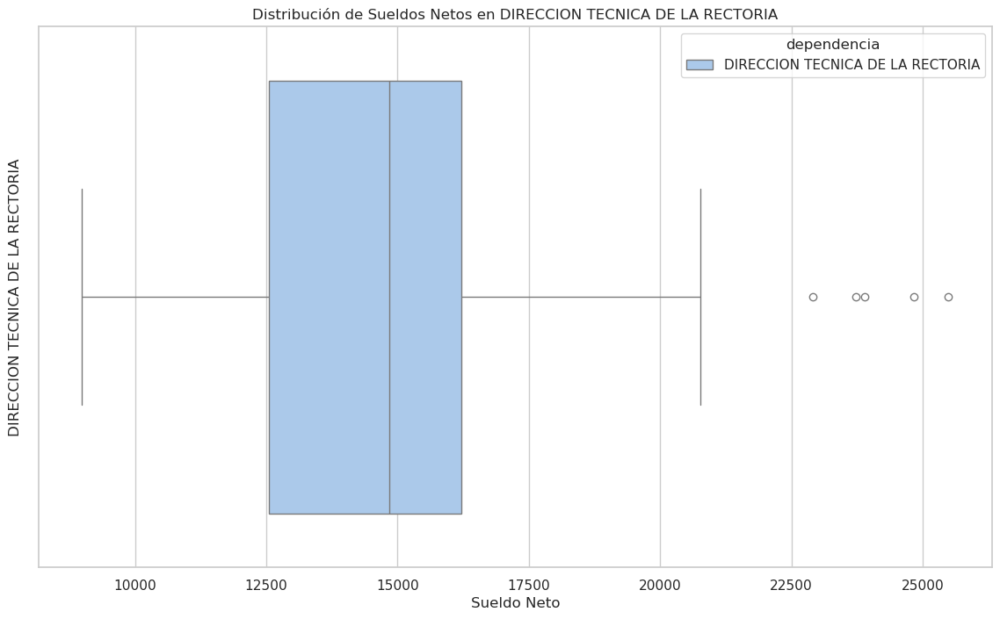

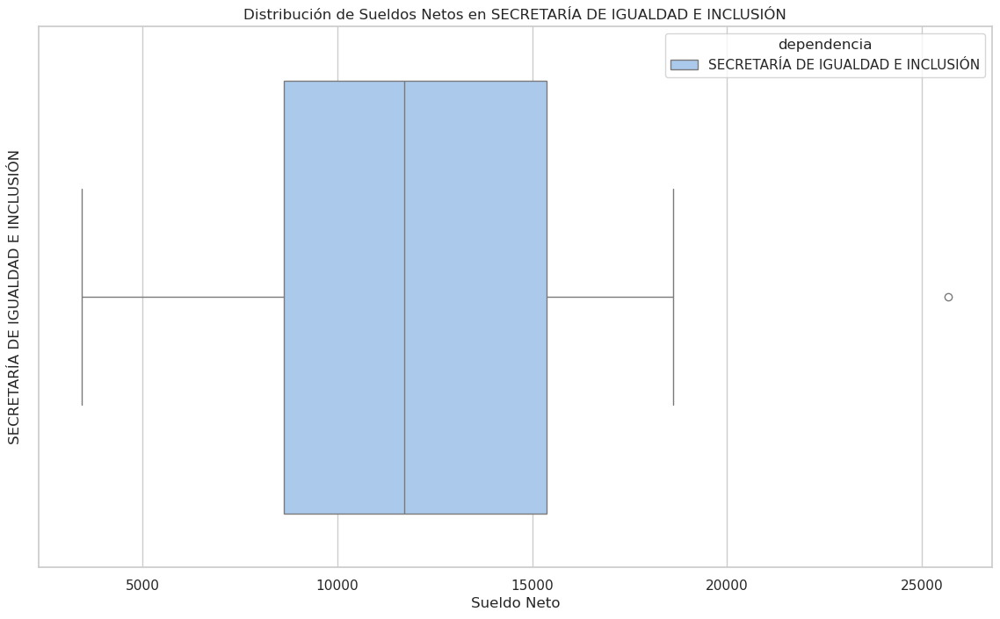

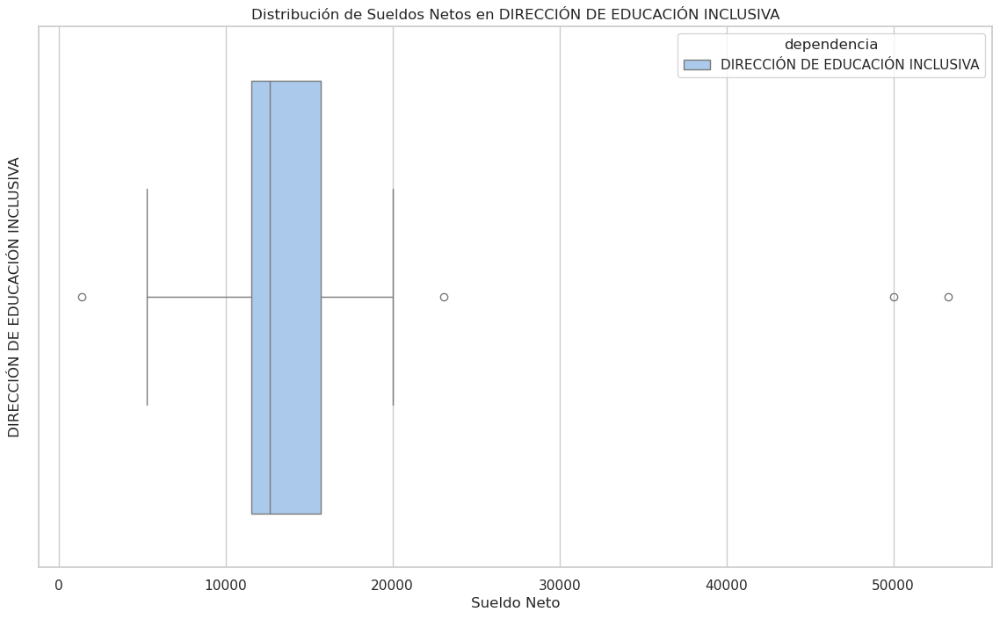

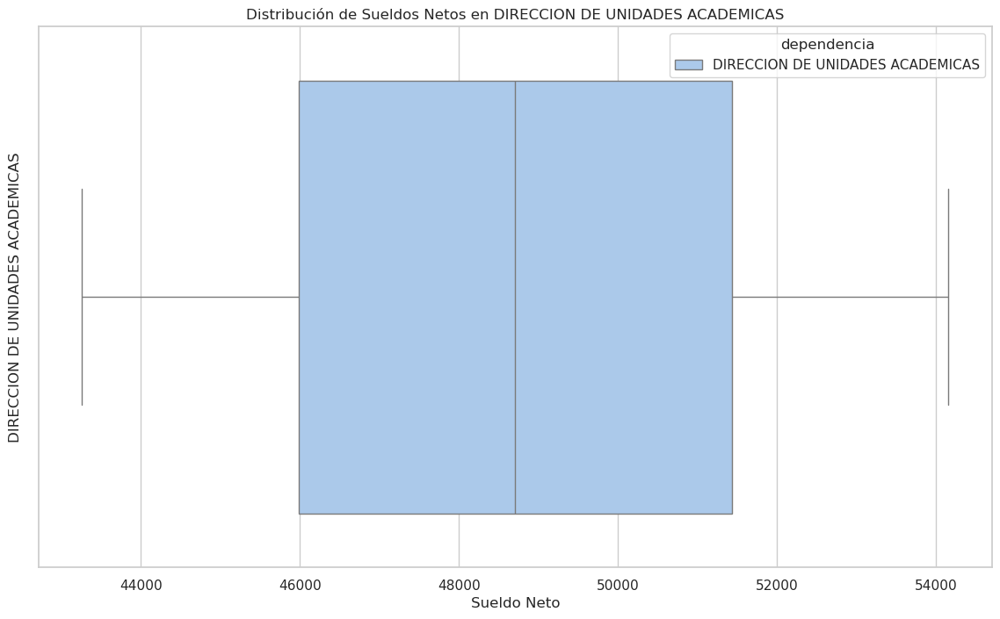

Gráficas generadas y guardadas en la carpeta 'img/boxplot_sueldos'.


In [56]:
dependencias = df['dependencia'].unique()

sns.set(style="whitegrid")
os.makedirs('img/boxplot_sueldos', exist_ok=True)
for dependencia in dependencias:
    dependencia_df = df[df['dependencia'] == dependencia]
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=dependencia_df, x='Sueldo Neto', palette='pastel', hue='dependencia')
    plt.title(f'Distribución de Sueldos Netos en {dependencia}')
    plt.xlabel('Sueldo Neto')
    plt.ylabel(dependencia)
    plt.savefig(f'img/boxplot_sueldos/boxplot_sueldos_{dependencia.replace(" ", "_")}.png')
    plt.show()
    plt.close()

print("Gráficas generadas y guardadas en la carpeta 'img/boxplot_sueldos'.")

In [68]:
df.to_csv('processed_uanl_pagos.csv', index=False)
print("Análisis exploratorio completado y datos procesados guardados en 'processed_uanl_pagos.csv'.")

Análisis exploratorio completado y datos procesados guardados en 'processed_uanl_pagos.csv'.
